## Imports

In [1]:
#sklearn imports
import sklearn
from sklearn import preprocessing, neighbors
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.cluster import KMeans
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.preprocessing import scale

#plotly imports
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

#matplotlib imports
import matplotlib.lines as mlines
import matplotlib.pyplot as plt

#other imports
import pandas as pd
import numpy as np
import random, os
import csv
from typing import Tuple

rng = 1

def seed_everything(seed=rng):
    """"
    Seed everything.
    """   
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    
print('The scikit-learn version is {}.'.format(sklearn.__version__))

The scikit-learn version is 0.24.2.


## Clustering

In [2]:
#cluster test/train data
def get_clusters(X_train: pd.DataFrame, X_test: pd.DataFrame, n_clusters: int) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    applies k-means clustering to training data to find clusters and predicts them for the test set
    """
    clustering = KMeans(n_clusters=n_clusters, random_state=rng)
    clustering.fit(X_train)
    # apply the labels to the training set
    train_labels = clustering.labels_
    X_train_clstrs = X_train.copy()
    X_train_clstrs['clusters'] = train_labels
    
    #write ext_clusters to csv
    #X_train_clstrs.to_csv('X_train_clstrs.csv')
    
    # predict labels on the test set
    test_labels = clustering.predict(X_test)
    X_test_clstrs = X_test.copy()
    X_test_clstrs['clusters'] = test_labels
    return X_train_clstrs, X_test_clstrs

#scale each feature
def scale_features(X_train: pd.DataFrame, X_test: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    applies standard scaler (z-scores) to training data and predicts z-scores for the test set
    """
    scaler = StandardScaler()
    to_scale = [col for col in X_train.columns.values]
    scaler.fit(X_train[to_scale])
    X_train[to_scale] = scaler.transform(X_train[to_scale])
    
    # predict z-scores on the test set
    X_test[to_scale] = scaler.transform(X_test[to_scale])
    
    return X_train, X_test



In [3]:
#TRAINING AND TESTING CLUSTERING/REGRESSION

#read in train/test data
df = pd.read_csv('..\..\data\_All_Receptors_runs_1_2_3_binary.csv')
df = df[['Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 's_score', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop', 'quality']]
df.fillna(-99999)

#get predictors from df, print to user
predictors = list(df.columns)
predictors = predictors[:-1]
print('Predictors:', predictors,'\n')

#split data into quality/not quality sets
q_ph4s = df[df['quality'] == 1]
nq_ph4s = df[df['quality'] != 1]

#ensure that there is an equal number of nq ph4s
nq_ph4s = nq_ph4s.sample(n=1*len(q_ph4s), random_state = rng)

#merge arrays prior to TTS
frames = [q_ph4s, nq_ph4s]
df = pd.concat(frames)

#x is features, y is classes
x = df.drop('quality', axis=1)
y = df.quality

#perform train/test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=rng)

#print the number of quality ph4s in the training and testing sets
print("x_train Q ph4s:", y_train.sum(),'\n')
print("x_test Q ph4s:",y_test.sum(),'\n')

#cluster the training and test sets into 5 clusters
X_train_clstrs, X_test_clstrs = get_clusters(x_train, x_test, 5)

#create dataframes with the original cluster labels prior to scaling
X_train_clusterlabels = pd.DataFrame(X_train_clstrs['clusters'])
X_test_clusterlabels = pd.DataFrame(X_test_clstrs['clusters'])

#scale training and testing data
X_train_scaled, X_test_scaled = scale_features(X_train_clstrs, X_test_clstrs)

print(len((X_train_scaled)))

# to divide the df by cluster, we need to ensure we use the correct class labels, use pandas to do that
train_clusters = X_train_scaled.copy()
test_clusters = X_test_scaled.copy()
train_clusters['y'] = y_train
test_clusters['y'] = y_test

#find unique cluster values
uniq_clusters = train_clusters['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()
print(uniqs)

# locate the "0" cluster
train_0 = train_clusters.loc[train_clusters.clusters <= uniqs[0]]
test_0 = test_clusters.loc[test_clusters.clusters <= uniqs[0]]
y_train_0 = train_0.y.values
y_test_0 = test_0.y.values
# locate the "1" cluster
train_1 = train_clusters.loc[(train_clusters.clusters <= uniqs[1]) & (train_clusters.clusters > uniqs[0])]
test_1 = test_clusters.loc[(test_clusters.clusters <= uniqs[1]) & (test_clusters.clusters > uniqs[0])]
y_train_1 = train_1.y.values
y_test_1 = test_1.y.values

# locate the "3" cluster
train_2 = train_clusters.loc[(train_clusters.clusters <= uniqs[2]) & (train_clusters.clusters > uniqs[1])]
test_2 = test_clusters.loc[(test_clusters.clusters <= uniqs[2]) & (test_clusters.clusters > uniqs[1])]
y_train_2 = train_2.y.values
y_test_2 = test_2.y.values

# locate the "4" cluster
train_3 = train_clusters.loc[(train_clusters.clusters <= uniqs[3]) & (train_clusters.clusters > uniqs[2])]
test_3 = test_clusters.loc[(test_clusters.clusters <= uniqs[3]) & (test_clusters.clusters > uniqs[2])]
y_train_3 = train_3.y.values
y_test_3 = test_3.y.values

# locate the "5" cluster 
train_4 = train_clusters.loc[(train_clusters.clusters <= uniqs[4]) & (train_clusters.clusters > uniqs[3])]
test_4 = test_clusters.loc[(test_clusters.clusters <= uniqs[4]) & (test_clusters.clusters > uniqs[3])]
y_train_4 = train_4.y.values
y_test_4 = test_4.y.values

# drop the targets from the training set
X_train_0 = train_0.drop(columns=['y'])
X_test_0 = test_0.drop(columns=['y'])
X_train_1 = train_1.drop(columns=['y'])
X_test_1 = test_1.drop(columns=['y'])
X_train_2 = train_2.drop(columns=['y'])
X_test_2 = test_2.drop(columns=['y'])
X_train_3 = train_3.drop(columns=['y'])
X_test_3 = test_3.drop(columns=['y'])
X_train_4 = train_4.drop(columns=['y'])
X_test_4 = test_4.drop(columns=['y'])

#print scaled cluster values
print('\n')
print('X_train 0/1/2/3/4 cluster values')
print('-------------------------------')
print(X_train_0['clusters'].unique())
print(X_train_1['clusters'].unique())
print(X_train_2['clusters'].unique())
print(X_train_3['clusters'].unique())
print(X_train_4['clusters'].unique(),'\n')

#0 cluster LR model
sgdc0 = SGDClassifier(loss="log", penalty="l1", max_iter=1000, tol=1e-3, class_weight='balanced', random_state = rng)
sgdc0.fit(X_train_0, y_train_0)
coef_table = pd.DataFrame(list(X_train_0.columns)).copy()

#predict the quality class for pharmacophore models in the 0 cluster and generate a confusion matrix
y_pred = (sgdc0.predict(X_test_0))
confmat = confusion_matrix(y_test_0, y_pred, labels=[0,1])
confmat = confusion_matrix(y_test_0, y_pred, labels=[0,1]).ravel()
FP = (confmat[1])
TP = (confmat[3])
PPV = (TP / (TP + FP))
cm = pd.crosstab(y_test_0, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)

#print the confusion matrix as well as classificaiton metrics
print('0 cluster model\n')
print(cm,'\n')
print("PPV:",format(metrics.precision_score(y_test_0,y_pred), '.2f'))
print("Accuracy:",format(metrics.accuracy_score(y_test_0, y_pred),'.2f'))
print("Recall:",format(metrics.recall_score(y_test_0, y_pred), '.2f'))
print("F1:",format(metrics.f1_score(y_test_0, y_pred), '.2f'),'\n')

#1 cluster LR model
sgdc1 = SGDClassifier(loss="log", penalty="l1", max_iter=1000, tol=1e-3, class_weight='balanced', random_state = rng)
sgdc1.fit(X_train_1, y_train_1)

#predict the quality class for pharmacophore models in the 1 cluster and generate a confusion matrix
y_pred = (sgdc1.predict(X_test_1))
confmat = confusion_matrix(y_test_1, y_pred, labels=[0,1])
confmat = confusion_matrix(y_test_1, y_pred, labels=[0,1]).ravel()
FP = (confmat[1])
TP = (confmat[3])
PPV = (TP / (TP + FP))
cm = pd.crosstab(y_test_1, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)

#print the confusion matrix as well as classificaiton metrics
print('1 cluster model\n')
print(cm,'\n')
print("PPV:",format(metrics.precision_score(y_test_1, y_pred), '.2f'))
print("Accuracy:",format(metrics.accuracy_score(y_test_1, y_pred),'.2f'))
print("Recall:",format(metrics.recall_score(y_test_1, y_pred), '.2f'))
print("F1:",format(metrics.f1_score(y_test_1, y_pred), '.2f'),'\n')

#2 cluster LR model
sgdc2 = SGDClassifier(loss="log", penalty="l1", max_iter=1000, tol=1e-3, class_weight='balanced', random_state = rng)
sgdc2.fit(X_train_2, y_train_2)

#predict the quality class for pharmacophore models in the 2 cluster and generate a confusion matrix
y_pred = (sgdc2.predict(X_test_2))
confmat = confusion_matrix(y_test_2, y_pred, labels=[0,1])
confmat = confusion_matrix(y_test_2, y_pred, labels=[0,1]).ravel()
FP = (confmat[1])
TP = (confmat[3])
PPV = (TP / (TP + FP))
cm = pd.crosstab(y_test_2, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)

#print the confusion matrix as well as classificaiton metrics
print('2 cluster model\n')
print(cm,'\n')
print("PPV:",format(metrics.precision_score(y_test_2, y_pred), '.2f'))
print("Accuracy:",format(metrics.accuracy_score(y_test_2, y_pred),'.2f'))
print("Recall:",format(metrics.recall_score(y_test_2, y_pred), '.2f'))
print("F1:",format(metrics.f1_score(y_test_2, y_pred), '.2f'),'\n')

#3 cluster LR model
sgdc3 = SGDClassifier(loss="log", penalty="l1", max_iter=1000, tol=1e-3, class_weight='balanced', random_state = rng)
sgdc3.fit(X_train_3, y_train_3)

#predict the quality class for pharmacophore models in the 3 cluster and generate a confusion matrix
y_pred = (sgdc3.predict(X_test_3))
confmat = confusion_matrix(y_test_3, y_pred, labels=[0,1])
confmat = confusion_matrix(y_test_3, y_pred, labels=[0,1]).ravel()
FP = (confmat[1])
TP = (confmat[3])
PPV = (TP / (TP + FP))
cm = pd.crosstab(y_test_3, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)

#print the confusion matrix as well as classificaiton metrics
print('3 cluster model\n')
print(cm,'\n')
print("PPV:",format(metrics.precision_score(y_test_3, y_pred), '.2f'))
print("Accuracy:",format(metrics.accuracy_score(y_test_3, y_pred),'.2f'))
print("Recall:",format(metrics.recall_score(y_test_3, y_pred), '.2f'))
print("F1:",format(metrics.f1_score(y_test_3, y_pred), '.2f'),'\n')

#4 cluster LR model
sgdc4 = SGDClassifier(loss="log", penalty="l1", max_iter=1000, tol=1e-3, class_weight='balanced', random_state = rng)
sgdc4.fit(X_train_4, y_train_4)

#predict the quality class for pharmacophore models in the 4 cluster and generate a confusion matrix
y_pred = (sgdc4.predict(X_test_4))
confmat = confusion_matrix(y_test_4, y_pred, labels=[0,1])
confmat = confusion_matrix(y_test_4, y_pred, labels=[0,1]).ravel()
FP = (confmat[1])
TP = (confmat[3])
PPV = (TP / (TP + FP))
cm = pd.crosstab(y_test_4, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)

#print the confusion matrix as well as classificaiton metrics
print('4 cluster model\n')
print(cm,'\n')
print("PPV:",format(metrics.precision_score(y_test_4, y_pred), '.2f'))
print("Accuracy:",format(metrics.accuracy_score(y_test_4, y_pred),'.2f'))
print("Recall:",format(metrics.recall_score(y_test_4, y_pred), '.2f'))
print("F1:",format(metrics.f1_score(y_test_4, y_pred), '.2f'),'\n')

Predictors: ['Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 's_score', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

x_train Q ph4s: 2739 

x_test Q ph4s: 882 

5431
[-0.9922842653702544, -0.3084756312850048, 0.37533300280024473, 1.0591416368854942, 1.7429502709707436]


X_train 0/1/2/3/4 cluster values
-------------------------------
[-0.99228427]
[-0.30847563]
[0.375333]
[1.05914164]
[1.74295027] 

0 cluster model

Predicted    0    1
Actual             
0          268   99
1           11  493 

PPV: 0.83
Accuracy: 0.87
Recall: 0.98
F1: 0.90 

1 cluster model

Predicted  0
Actual      
0          5
1          6 

PPV: 0.00
Accuracy: 0.45
Recall: 0.00
F1: 0.00 

2 cluster model

Predicted  0    1
Actual           
0          5   27
1          9  138 

PPV: 0.84
Accuracy: 0.80
Recall: 0.94
F1: 0.88 

3 cluster model

Predicted    0    1
Actual             
0          468   38
1           11  180 

PPV: 0.83
Accura

C:\Users\Greg\AppData\Local\Temp/ipykernel_25768/68984064.py:142: RuntimeWarning:

invalid value encountered in longlong_scalars

C:\Users\Greg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



In [4]:
coef_table.insert(len(coef_table.columns),"Coefs",sgdc0.coef_.transpose())
coef_table

,0,Coefs
0,Hits,4.890402
1,max_feat,-0.591873
2,avg_feat,0.096646
3,max_centr,0.367683
4,min_centr,0.000000
5,avg_centr,-0.606385
6,features,3.274273
7,all_same,-0.553905
8,s_score,0.000000
9,hyd_prop,0.761054


## PCA

### Training Data

In [5]:
#TRAINING DATA PCA

plotX = X_train_clstrs.copy()
#print(plotX['clusters'].unique())
#print(plotX.index)
#print(plotX.head())

#PCA with two principal components
pca_2d = PCA(n_components=2)

clusters = plotX['clusters']

#This DataFrame contains the two principal components that will be used
#for the 2-D visualization mentioned above
PCs_2d = pd.DataFrame(pca_2d.fit_transform(plotX.drop(['clusters'], axis=1)))
print(pca_2d.explained_variance_ratio_)

#"PC1_2d" means: 'The first principal component of the components created for 2-D visualization, by PCA.'
#And "PC2_2d" means: 'The second principal component of the components created for 2-D visualization, by PCA.'
PCs_2d.columns = ["PC1_2d", "PC2_2d"]
PCs_2d.set_index(plotX.index, inplace = True)
#PCs_2d.to_csv('PCs_2d.csv')

plotX['PC1_2d'] = PCs_2d['PC1_2d']
plotX['PC2_2d'] = PCs_2d['PC2_2d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

#print(cluster1)

#print(plotX.head())

#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = cluster0["PC1_2d"],
                    y = cluster0["PC2_2d"],
                    mode = "markers",
                    name = "Cluster I",
                    marker = dict(color = 'rgba(228,26,28,0.8)'),
                    text = None)

#trace2 is for 'Cluster 1'
trace2 = go.Scatter(
                    x = cluster1["PC1_2d"],
                    y = cluster1["PC2_2d"],
                    mode = "markers",
                    name = "Cluster II",
                    marker = dict(color = 'rgba(55,126,184, 0.8)'),
                    text = None)

#trace3 is for 'Cluster 2'
trace3 = go.Scatter(
                    x = cluster2["PC1_2d"],
                    y = cluster2["PC2_2d"],
                    mode = "markers",
                    name = "Cluster III",
                    marker = dict(color = 'rgba(77,175,74, 0.8)'),
                    text = None)

#trace4 is for 'Cluster 3'
trace4 = go.Scatter(
                    x = cluster3["PC1_2d"],
                    y = cluster3["PC2_2d"],
                    mode = "markers",
                    name = "Cluster IV",
                    marker = dict(color = 'rgba(152,78,163, 0.8)'),
                    text = None)

#trace5 is for 'Cluster 4'
trace5 = go.Scatter(
                    x = cluster4["PC1_2d"],
                    y = cluster4["PC2_2d"],
                    mode = "markers",
                    name = "Cluster V",
                    marker = dict(color = 'rgba(255,127,0, 0.8)'),
                    text = None)



data = [trace1, trace2, trace3, trace4, trace5]

#title = "Visualizing Clusters in Two Dimensions Using PCA"

layout = dict(xaxis= dict(title= 'PC1',dtick= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False),
              font_family="Arial",
              font = dict(size=16),
              width=800,
              height=400
             )

fig = dict(data = data, layout = layout)

iplot(fig)



[0.27293728 0.1373105 ]


In [6]:
#TRAINING DATA PCA (3D)

plotX = X_train_clstrs.copy()
#print(plotX['clusters'].unique())
#print(plotX.index)
#print(plotX.head())

#PCA with two principal components
pca_3d = PCA(n_components=3)

clusters = plotX['clusters']

#This DataFrame contains the two principal components that will be used
#for the 2-D visualization mentioned above
PCs_3d = pd.DataFrame(pca_3d.fit_transform(plotX.drop(['clusters'], axis=1)))
print(pca_3d.explained_variance_ratio_)

#"PC1_2d" means: 'The first principal component of the components created for 2-D visualization, by PCA.'
#And "PC2_2d" means: 'The second principal component of the components created for 2-D visualization, by PCA.'
PCs_3d.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]
PCs_3d.set_index(plotX.index, inplace = True)

plotX['PC1_3d'] = PCs_3d['PC1_3d']
plotX['PC2_3d'] = PCs_3d['PC2_3d']
plotX['PC3_3d'] = PCs_3d['PC3_3d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

PLOT = go.Figure()

# cluster I
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[0]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[0]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[0]]['PC3_3d'],
                                name = "Cluster I",
                                marker = dict(color = 'rgba(228,26,28,1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster II
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[1]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[1]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[1]]['PC3_3d'],
                                name = "Cluster II",
                                marker = dict(color = 'rgba(55,126,184, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster III
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[2]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[2]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[2]]['PC3_3d'],
                                name = "Cluster III",
                                marker = dict(color = 'rgba(77,175,74, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster IV
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[3]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[3]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[3]]['PC3_3d'],
                                name = "Cluster IV",
                                marker = dict(color = 'rgba(152,78,163, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster V
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[4]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[4]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[4]]['PC3_3d'],
                                name = "Cluster V",
                                marker = dict(color = 'rgba(255,127,0, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'PC1', titlefont_color = 'black'),
                                yaxis=dict(title = 'PC2', titlefont_color = 'black'),
                                zaxis=dict(title = 'PC3', titlefont_color = 'black')),
                   font = dict(family = "Arial", color  = 'black', size = 12))


[0.27293728 0.1373105  0.09973461]


### Testing Data

In [7]:
#TESTING DATA PCA
plotX = X_test_clstrs.copy()

#PCA with two principal components
pca_2d = PCA(n_components=2)

clusters = plotX['clusters']

#This DataFrame contains the two principal components that will be used
#for the 2-D visualization mentioned above
PCs_2d = pd.DataFrame(pca_2d.fit_transform(plotX.drop(['clusters'], axis=1)))

#"PC1_2d" means: 'The first principal component of the components created for 2-D visualization, by PCA.'
#And "PC2_2d" means: 'The second principal component of the components created for 2-D visualization, by PCA.'
PCs_2d.columns = ["PC1_2d", "PC2_2d"]
PCs_2d.set_index(plotX.index, inplace = True)

plotX['PC1_2d'] = PCs_2d['PC1_2d']
plotX['PC2_2d'] = PCs_2d['PC2_2d']

uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = cluster0["PC1_2d"],
                    y = cluster0["PC2_2d"],
                    mode = "markers",
                    name = "Cluster I",
                    marker = dict(color = 'rgba(228,26,28,0.8)'),
                    text = None)

#trace2 is for 'Cluster 1'
trace2 = go.Scatter(
                    x = cluster1["PC1_2d"],
                    y = cluster1["PC2_2d"],
                    mode = "markers",
                    name = "Cluster II",
                    marker = dict(color = 'rgba(55,126,184, 0.8)'),
                    text = None)

#trace3 is for 'Cluster 2'
trace3 = go.Scatter(
                    x = cluster2["PC1_2d"],
                    y = cluster2["PC2_2d"],
                    mode = "markers",
                    name = "Cluster III",
                    marker = dict(color = 'rgba(77,175,74, 0.8)'),
                    text = None)

#trace4 is for 'Cluster 3'
trace4 = go.Scatter(
                    x = cluster3["PC1_2d"],
                    y = cluster3["PC2_2d"],
                    mode = "markers",
                    name = "Cluster IV",
                    marker = dict(color = 'rgba(152,78,163, 0.8)'),
                    text = None)

#trace5 is for 'Cluster 4'
trace5 = go.Scatter(
                    x = cluster4["PC1_2d"],
                    y = cluster4["PC2_2d"],
                    mode = "markers",
                    name = "Cluster V",
                    marker = dict(color = 'rgba(255,127,0, 0.8)'),
                    text = None)



data = [trace1, trace2, trace3, trace4, trace5]

#title = "Visualizing Clusters in Two Dimensions Using PCA"

layout = dict(xaxis= dict(title= 'PC1',dtick= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False),
              font_family="Arial",
              font = dict(size=16),
              width=800,
              height=400
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [8]:
#Testing DATA PCA (3D)

plotX = X_test_clstrs.copy()
#print(plotX['clusters'].unique())
#print(plotX.index)
#print(plotX.head())

#PCA with two principal components
pca_3d = PCA(n_components=3)

clusters = plotX['clusters']

#This DataFrame contains the two principal components that will be used
#for the 2-D visualization mentioned above
PCs_3d = pd.DataFrame(pca_3d.fit_transform(plotX.drop(['clusters'], axis=1)))
print(pca_3d.explained_variance_ratio_)

#"PC1_2d" means: 'The first principal component of the components created for 2-D visualization, by PCA.'
#And "PC2_2d" means: 'The second principal component of the components created for 2-D visualization, by PCA.'
PCs_3d.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]
PCs_3d.set_index(plotX.index, inplace = True)

plotX['PC1_3d'] = PCs_3d['PC1_3d']
plotX['PC2_3d'] = PCs_3d['PC2_3d']
plotX['PC3_3d'] = PCs_3d['PC3_3d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

PLOT = go.Figure()

# cluster I
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[0]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[0]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[0]]['PC3_3d'],
                                name = "Cluster I",
                                marker = dict(color = 'rgba(228,26,28,1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster II
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[1]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[1]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[1]]['PC3_3d'],
                                name = "Cluster II",
                                marker = dict(color = 'rgba(55,126,184, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster III
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[2]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[2]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[2]]['PC3_3d'],
                                name = "Cluster III",
                                marker = dict(color = 'rgba(77,175,74, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster IV
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[3]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[3]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[3]]['PC3_3d'],
                                name = "Cluster IV",
                                marker = dict(color = 'rgba(152,78,163, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster V
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[4]]['PC1_3d'],
                                y = plotX[plotX.clusters == uniqs[4]]['PC2_3d'],
                                z = plotX[plotX.clusters == uniqs[4]]['PC3_3d'],
                                name = "Cluster V",
                                marker = dict(color = 'rgba(255,127,0, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'PC1', titlefont_color = 'black'),
                                yaxis=dict(title = 'PC2', titlefont_color = 'black'),
                                zaxis=dict(title = 'PC3', titlefont_color = 'black')),
                   font = dict(family = "Arial", color  = 'black', size = 12))

[0.28008905 0.13199638 0.09639529]


## T-SNE

In [9]:
from sklearn.manifold import TSNE

### Training Data

In [10]:
#TRAINING DATA T-SNE (2D)
plotX = X_train_clstrs.copy()

#TSNE with two components
TSNE_instance = TSNE(n_components=2, init='random', random_state = rng)

TSNE_2d = pd.DataFrame(TSNE_instance.fit_transform(plotX.drop(['clusters'], axis=1)))

TSNE_2d.columns = ["TSNE1_2d", "TSNE2_2d"]
TSNE_2d.set_index(plotX.index, inplace = True)
#PCs_2d.to_csv('PCs_2d.csv')

#plotX['clusters'] = clusters
plotX['TSNE1_2d'] = TSNE_2d['TSNE1_2d']
plotX['TSNE2_2d'] = TSNE_2d['TSNE2_2d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = cluster0["TSNE1_2d"],
                    y = cluster0["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster I",
                    marker = dict(color = 'rgba(228,26,28,0.8)'),
                    text = None)

#trace2 is for 'Cluster 1'
trace2 = go.Scatter(
                    x = cluster1["TSNE1_2d"],
                    y = cluster1["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster II",
                    marker = dict(color = 'rgba(55,126,184, 0.8)'),
                    text = None)

#trace3 is for 'Cluster 2'
trace3 = go.Scatter(
                    x = cluster2["TSNE1_2d"],
                    y = cluster2["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster III",
                    marker = dict(color = 'rgba(77,175,74, 0.8)'),
                    text = None)

#trace4 is for 'Cluster 3'
trace4 = go.Scatter(
                    x = cluster3["TSNE1_2d"],
                    y = cluster3["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster IV",
                    marker = dict(color = 'rgba(152,78,163, 0.8)'),
                    text = None)

#trace5 is for 'Cluster 4'
trace5 = go.Scatter(
                    x = cluster4["TSNE1_2d"],
                    y = cluster4["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster V",
                    marker = dict(color = 'rgba(255,127,0, 0.8)'),
                    text = None)



data = [trace1, trace2, trace3, trace4, trace5]

#title = "Visualizing Clusters in Two Dimensions Using PCA"

layout = dict(xaxis= dict(title= 'Dimension 1', dtick = 15, ticklen = 5, zeroline= False),
              yaxis= dict(title= 'Dimension 2', dtick = 15, ticklen= 5, zeroline= False),
              font_family="Arial",
              font = dict(size=16),
              width=800,
              height=400
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [11]:
#TRAINING DATA T-SNE (3D)
plotX = X_train_clstrs.copy()

#TSNE with two components
TSNE_instance = TSNE(n_components=3, init='random', random_state = rng)

TSNE_3d = pd.DataFrame(TSNE_instance.fit_transform(plotX.drop(['clusters'], axis=1)))

TSNE_3d.columns = ["TSNE1_3d", "TSNE2_3d",  "TSNE3_3d"]
TSNE_3d.set_index(plotX.index, inplace = True)

#plotX['clusters'] = clusters
plotX['TSNE1_3d'] = TSNE_3d['TSNE1_3d']
plotX['TSNE2_3d'] = TSNE_3d['TSNE2_3d']
plotX['TSNE3_3d'] = TSNE_3d['TSNE3_3d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

PLOT = go.Figure()

# cluster I
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[0]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[0]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[0]]['TSNE3_3d'],
                                name = "Cluster I",
                                marker = dict(color = 'rgba(228,26,28,1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster II
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[1]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[1]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[1]]['TSNE3_3d'],
                                name = "Cluster II",
                                marker = dict(color = 'rgba(55,126,184, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster III
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[2]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[2]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[2]]['TSNE3_3d'],
                                name = "Cluster III",
                                marker = dict(color = 'rgba(77,175,74, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster IV
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[3]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[3]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[3]]['TSNE3_3d'],
                                name = "Cluster IV",
                                marker = dict(color = 'rgba(152,78,163, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster V
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[4]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[4]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[4]]['TSNE3_3d'],
                                name = "Cluster V",
                                marker = dict(color = 'rgba(255,127,0, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Dimension 1', titlefont_color = 'black'),
                                yaxis=dict(title = 'Dimension 2', titlefont_color = 'black'),
                                zaxis=dict(title = 'Dimension 3', titlefont_color = 'black')),
                   font = dict(family = "Arial", color  = 'black', size = 12))

### Testing Data

In [12]:
#TESTING DATA T-SNE (2D)
plotX = X_test_clstrs.copy()

#TSNE with two components
TSNE_instance = TSNE(n_components=2, init='random', random_state = rng)

TSNE_2d = pd.DataFrame(TSNE_instance.fit_transform(plotX.drop(['clusters'], axis=1)))

TSNE_2d.columns = ["TSNE1_2d", "TSNE2_2d"]
TSNE_2d.set_index(plotX.index, inplace = True)
#PCs_2d.to_csv('PCs_2d.csv')

plotX['TSNE1_2d'] = TSNE_2d['TSNE1_2d']
plotX['TSNE2_2d'] = TSNE_2d['TSNE2_2d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = cluster0["TSNE1_2d"],
                    y = cluster0["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster I",
                    marker = dict(color = 'rgba(228,26,28,0.8)'),
                    text = None)

#trace2 is for 'Cluster 1'
trace2 = go.Scatter(
                    x = cluster1["TSNE1_2d"],
                    y = cluster1["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster II",
                    marker = dict(color = 'rgba(55,126,184, 0.8)'),
                    text = None)

#trace3 is for 'Cluster 2'
trace3 = go.Scatter(
                    x = cluster2["TSNE1_2d"],
                    y = cluster2["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster III",
                    marker = dict(color = 'rgba(77,175,74, 0.8)'),
                    text = None)

#trace4 is for 'Cluster 3'
trace4 = go.Scatter(
                    x = cluster3["TSNE1_2d"],
                    y = cluster3["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster IV",
                    marker = dict(color = 'rgba(152,78,163, 0.8)'),
                    text = None)

#trace5 is for 'Cluster 4'
trace5 = go.Scatter(
                    x = cluster4["TSNE1_2d"],
                    y = cluster4["TSNE2_2d"],
                    mode = "markers",
                    name = "Cluster V",
                    marker = dict(color = 'rgba(255,127,0, 0.8)'),
                    text = None)



data = [trace1, trace2, trace3, trace4, trace5]

#title = "Visualizing Clusters in Two Dimensions Using PCA"

layout = dict(xaxis= dict(title= 'Dimension 1', dtick = 15, ticklen = 5, zeroline= False),
              yaxis= dict(title= 'Dimension 2', dtick = 15, ticklen= 5, zeroline= False),
              font_family="Arial",
              font = dict(size=16),
              width=800,
              height=400
             )

fig = dict(data = data, layout = layout)

iplot(fig)

In [13]:
#TESTING DATA T-SNE (3D)
plotX = X_test_clstrs.copy()

#TSNE with two components
TSNE_instance = TSNE(n_components=3, init='random', random_state = rng)

TSNE_3d = pd.DataFrame(TSNE_instance.fit_transform(plotX.drop(['clusters'], axis=1)))

TSNE_3d.columns = ["TSNE1_3d", "TSNE2_3d",  "TSNE3_3d"]
TSNE_3d.set_index(plotX.index, inplace = True)

#plotX['clusters'] = clusters
plotX['TSNE1_3d'] = TSNE_3d['TSNE1_3d']
plotX['TSNE2_3d'] = TSNE_3d['TSNE2_3d']
plotX['TSNE3_3d'] = TSNE_3d['TSNE3_3d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == uniqs[0]]
cluster1 = plotX[plotX['clusters'] == uniqs[1]]
cluster2 = plotX[plotX['clusters'] == uniqs[2]]
cluster3 = plotX[plotX['clusters'] == uniqs[3]]
cluster4 = plotX[plotX['clusters'] == uniqs[4]]

PLOT = go.Figure()

# cluster I
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[0]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[0]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[0]]['TSNE3_3d'],
                                name = "Cluster I",
                                marker = dict(color = 'rgba(228,26,28,1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster II
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[1]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[1]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[1]]['TSNE3_3d'],
                                name = "Cluster II",
                                marker = dict(color = 'rgba(55,126,184, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster III
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[2]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[2]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[2]]['TSNE3_3d'],
                                name = "Cluster III",
                                marker = dict(color = 'rgba(77,175,74, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster IV
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[3]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[3]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[3]]['TSNE3_3d'],
                                name = "Cluster IV",
                                marker = dict(color = 'rgba(152,78,163, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

# cluster V
PLOT.add_trace(go.Scatter3d(x = plotX[plotX.clusters == uniqs[4]]['TSNE1_3d'],
                                y = plotX[plotX.clusters == uniqs[4]]['TSNE2_3d'],
                                z = plotX[plotX.clusters == uniqs[4]]['TSNE3_3d'],
                                name = "Cluster V",
                                marker = dict(color = 'rgba(255,127,0, 1)'),
                                mode = 'markers', marker_size = 8, marker_line_width = 1,
                                ))

PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Dimension 1', titlefont_color = 'black'),
                                yaxis=dict(title = 'Dimension 2', titlefont_color = 'black'),
                                zaxis=dict(title = 'Dimension 3', titlefont_color = 'black')),
                   font = dict(family = "Arial", color  = 'black', size = 12))

## Parallel Coordinates Plots

[-0.99228427 -0.30847563  1.05914164  0.375333    1.74295027]


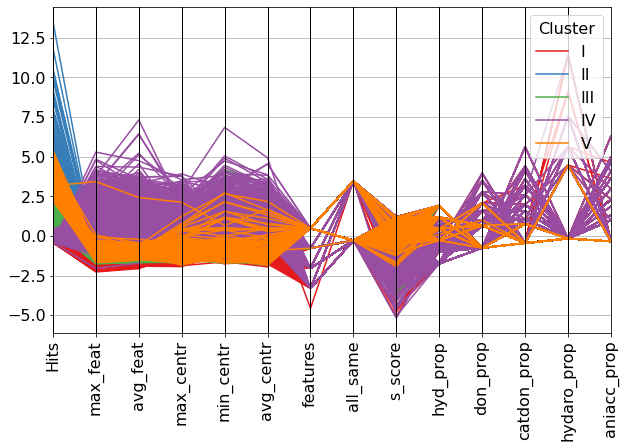

In [14]:
#parallel coordinates plot for training set
plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size': 16})
#X_train_clstrs = X_train_clstrs.drop('PC1_2d', axis=1)
#X_train_clstrs = X_train_clstrs.drop('PC2_2d', axis=1)
#print(clusters.head())
#print(clusters.unique())
print(clusters.unique())
#X_train_clstrs.to_csv('X_train_clstrs.csv')
X_train_clstrs = X_train_clstrs.sort_values(by = 'clusters')
plot = pd.plotting.parallel_coordinates(X_train_clstrs, 'clusters', color=['#e41a1c','#377eb8','#4daf4a', '#984ea3', '#ff7f00'])
plot.tick_params(axis='x', rotation=90)
I_line = mlines.Line2D([], [], color='#e41a1c', label='I')
II_line = mlines.Line2D([], [], color='#377eb8', label='II')
III_line = mlines.Line2D([], [], color='#4daf4a', label='III')
IV_line = mlines.Line2D([], [], color='#984ea3', label='IV')
V_line = mlines.Line2D([], [], color='#ff7f00', label='V')
plot.legend(title = "Cluster", handles = [I_line, II_line, III_line, IV_line, V_line], loc = 'upper right')

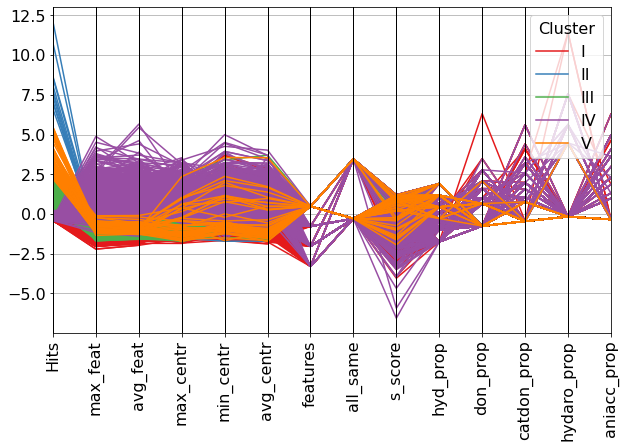

In [15]:
#parallel coordinates plot for test set
plt.figure(figsize=(10,6))
#X_test_clstrs = X_test_clstrs.drop('PC1_2d', axis=1)
#X_test_clstrs = X_test_clstrs.drop('PC2_2d', axis=1)
X_test_clstrs = X_test_clstrs.sort_values(by = 'clusters')
plot = pd.plotting.parallel_coordinates(X_test_clstrs, 'clusters', color=['#e41a1c','#377eb8','#4daf4a', '#984ea3', '#ff7f00'])
plot.tick_params(axis='x', rotation=90)
I_line = mlines.Line2D([], [], color='#e41a1c', label='I')
II_line = mlines.Line2D([], [], color='#377eb8', label='II')
III_line = mlines.Line2D([], [], color='#4daf4a', label='III')
IV_line = mlines.Line2D([], [], color='#984ea3', label='IV')
V_line = mlines.Line2D([], [], color='#ff7f00', label='V')
plot.legend(title = "Cluster", handles = [I_line, II_line, III_line, IV_line, V_line], loc = 'upper right')

## External Data Classification

In [16]:
def scale_features_single(X: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    applies standard scaler (z-scores) to training data and predicts z-scores for the test set
    """
    scaler = StandardScaler()
    to_scale = [col for col in X.columns.values]
    scaler.fit(X[to_scale])
    X[to_scale] = scaler.transform(X[to_scale])
    
    return X

#EXTERNAL DATA CLUSTERING/REGRESSION
def classify_ext_data(input_csv, subset = "none"):    
    #read csv with exteral data
    ext_df = pd.read_csv(input_csv)
    ext_df.fillna(-99999)
    receptors = ext_df.Receptor
    hits_actual = ext_df.Hits
    score_types = ext_df['Score Type']
    subsets = ext_df.subset
    match_features = ext_df.match_features
    init_ext_df = ext_df
    
    #check if a 'quality' column exists. one will not exist if classifying data with unknown enrichment values.
    if 'quality' not in ext_df:
        ext_df = ext_df[['s_score','Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop']]
        x = ext_df
    else:
        ext_df = ext_df[['s_score','Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop', 'quality']]   
        x = ext_df.drop('quality', axis=1)
        y = ext_df.quality
    
    #get predictors from dataset and print to user
    predictors = list(ext_df.columns)
    predictors = predictors[:-1]
    print('Predictors:', predictors,'\n')
    
    if 'quality' in init_ext_df:
        print("score based Q ph4s:", y.sum(),'\n')
    
    #cluster training data
    clustering = KMeans(n_clusters=5, random_state=rng)
    clustering.fit(x_train)
    
    # apply the labels to the training set
    train_labels = clustering.labels_
    X_train_clstrs = x_train.copy()
    X_train_clstrs['clusters'] = train_labels
    
    # predict labels on the external set
    ext_labels = clustering.predict(x)
    X_clstrs = x.copy()
    X_clstrs['clusters'] = ext_labels
    
    #scale the external dataset
    X_scaled = scale_features_single(X_clstrs)
    ext_clusters = X_scaled.copy()
    if 'quality' in init_ext_df:
        ext_clusters['y'] = y
    
    #add non-scaled receptors, hits_actual, score type, and subset columns back prior to 0/1/2/3 split
    ext_clusters['Receptor'] = receptors
    ext_clusters['hits_actual'] = hits_actual
    ext_clusters['Score Type'] = score_types
    ext_clusters['subset'] = subsets
    ext_clusters['match_features'] = match_features
    
    #write ext_clusters to csv
    #X_train_clstrs.to_csv('X_train_clstrs2.csv')
    
    # locate the "0" cluster
    ext_0 = ext_clusters.loc[ext_clusters.clusters <= uniqs[0]]
    if 'quality' in init_ext_df:
        y_ext_0 = ext_0.y.values
    ext_0_receptors = ext_0.Receptor
    ext_0_hits_actual = ext_0.hits_actual
    ext_0_score_types = ext_0['Score Type']
    ext_0_subsets = ext_0.subset
    ext_0_match_features = ext_0.match_features
    
    # locate the "1" cluster
    ext_1 = ext_clusters.loc[(ext_clusters.clusters <= uniqs[1]) & (ext_clusters.clusters > uniqs[0])] # after scaling, 0 went negtive
    if 'quality' in init_ext_df:
        y_ext_1 = ext_1.y.values
    ext_1_receptors = ext_1.Receptor
    ext_1_hits_actual = ext_1.hits_actual
    ext_1_score_types = ext_1['Score Type']
    ext_1_subsets = ext_1.subset
    ext_1_match_features = ext_1.match_features
    
    # locate the "2" cluster
    ext_2 = ext_clusters.loc[(ext_clusters.clusters <= uniqs[2]) & (ext_clusters.clusters > uniqs[1])] # after scaling, 0 went negtive
    if 'quality' in init_ext_df:
        y_ext_2 = ext_2.y.values
    ext_2_receptors = ext_2.Receptor
    ext_2_hits_actual = ext_2.hits_actual
    ext_2_score_types = ext_2['Score Type']
    ext_2_subsets = ext_2.subset
    ext_2_match_features = ext_2.match_features
    
    # locate the "3" cluster
    ext_3 = ext_clusters.loc[(ext_clusters.clusters <= uniqs[3]) & (ext_clusters.clusters > uniqs[2])] # after scaling, 0 went negtive
    if 'quality' in init_ext_df:
        y_ext_3 = ext_3.y.values
    ext_3_receptors = ext_3.Receptor
    ext_3_hits_actual = ext_3.hits_actual
    ext_3_score_types = ext_3['Score Type']
    ext_3_subsets = ext_3.subset
    ext_3_match_features = ext_3.match_features
    
    # locate the "4" cluster
    ext_4 = ext_clusters.loc[(ext_clusters.clusters <= uniqs[4]) & (ext_clusters.clusters > uniqs[3])] # after scaling, 0 went negtive
    if 'quality' in init_ext_df:
        y_ext_4 = ext_4.y.values
    ext_4_receptors = ext_4.Receptor
    ext_4_hits_actual = ext_4.hits_actual
    ext_4_score_types = ext_4['Score Type']
    ext_4_subsets = ext_4.subset
    ext_4_match_features = ext_4.match_features

    # drop the targets from each external set (if classifying known external data)
    if 'quality' in init_ext_df:
        X_ext_0 = ext_0.drop(columns=['y', 'Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_1 = ext_1.drop(columns=['y', 'Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_2 = ext_2.drop(columns=['y', 'Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_3 = ext_3.drop(columns=['y', 'Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_4 = ext_4.drop(columns=['y', 'Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
    else:
        X_ext_0 = ext_0.drop(columns=['Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_1 = ext_1.drop(columns=['Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_2 = ext_2.drop(columns=['Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_3 = ext_3.drop(columns=['Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
        X_ext_4 = ext_4.drop(columns=['Receptor', 'hits_actual', 'Score Type', 'subset', 'match_features'])
    
    #predict the quality class of external set ph4s in the 0 cluster with the 0 cluster classifier
    print('0 cluster model\n')
    print('---------------\n')
    if len(X_ext_0) == 0:
        print('No cluster 0 data.\n')
    else:
        y_pred = (sgdc0.predict(X_ext_0))
        if 'quality' in init_ext_df:
            confmat = confusion_matrix(y_ext_0, y_pred, labels=[0,1])
            confmat = confusion_matrix(y_ext_0, y_pred, labels=[0,1]).ravel()
            FP = (confmat[1])
            TP = (confmat[3])
            PPV = (TP / (TP + FP))
            cm = pd.crosstab(y_ext_0, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)
            print(cm,'\n')
            print('PPV:', format(PPV, '.2f'),'\n')
        
        X_ext_0['Receptor'] = ext_0_receptors
        X_ext_0['hits_actual'] = ext_0_hits_actual
        X_ext_0['Score Type'] = ext_0_score_types
        X_ext_0['subset'] = ext_0_subsets
        X_ext_0['match_features'] = ext_0_match_features
        if 'quality' in init_ext_df:
            X_ext_0['quality'] = y_ext_0
        
        X_ext_0['quality_pred'] = y_pred
        if 'quality' in init_ext_df:
            X_ext_0.to_csv('results/'+subset+'/k5_0cluster_results.csv')
        #if classifying unknown external data, print the ph4s classified as quality and write them to .csv
        if 'quality' not in init_ext_df:
            print(X_ext_0.loc[X_ext_0['quality_pred'] == 1], '\n')
            ph4_preds = X_ext_0.loc[X_ext_0['quality_pred'] == 1]
            ph4_preds.to_csv('predictions/k5_0cluster_ph4_preds.csv')
    
    #predict the quality class of external set ph4s in the 1 cluster with the 1 cluster classifier
    print('1 cluster model\n')
    print('---------------\n')
    if len(X_ext_1) == 0:
        print('No cluster 1 data.\n')
    else:
        y_pred = (sgdc1.predict(X_ext_1))
        if 'quality' in init_ext_df:
            confmat = confusion_matrix(y_ext_1, y_pred, labels=[0,1])
            confmat = confusion_matrix(y_ext_1, y_pred, labels=[0,1]).ravel()
            FP = (confmat[1])
            TP = (confmat[3])
            PPV = (TP / (TP + FP))
            cm = pd.crosstab(y_ext_1, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)
            print(cm,'\n')
            print('PPV:', format(PPV, '.2f'),'\n')
        
        X_ext_1['Receptor'] = ext_1_receptors
        X_ext_1['hits_actual'] = ext_1_hits_actual
        X_ext_1['Score Type'] = ext_1_score_types
        X_ext_1['subset'] = ext_1_subsets
        X_ext_1['match_features'] = ext_1_match_features
        if 'quality' in init_ext_df:
            X_ext_1['quality'] = y_ext_1
        
        X_ext_1['quality_pred'] = y_pred
        if 'quality' in init_ext_df:
            X_ext_1.to_csv('results/'+subset+'/k5_1cluster_results.csv')
        if 'quality' not in init_ext_df:
            print(X_ext_1.loc[X_ext_1['quality_pred'] == 1], '\n')
            ph4_preds = X_ext_1.loc[X_ext_1['quality_pred'] == 1]
            ph4_preds.to_csv('predictions/k5_1cluster_ph4_preds.csv')
    
    #predict the quality class of external set ph4s in the 2 cluster with the 2 cluster classifier
    print('2 cluster model\n')
    print('---------------\n')
    if len(X_ext_2) == 0:
        print('No cluster 2 data.\n')
    else:
        y_pred = (sgdc2.predict(X_ext_2))
        if 'quality' in init_ext_df:
            confmat = confusion_matrix(y_ext_2, y_pred, labels=[0,1])
            confmat = confusion_matrix(y_ext_2, y_pred, labels=[0,1]).ravel()
            FP = (confmat[1])
            TP = (confmat[3])
            PPV = (TP / (TP + FP))
            cm = pd.crosstab(y_ext_2, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)
            print(cm,'\n')
            print('PPV:', format(PPV, '.2f'),'\n')
        
        X_ext_2['Receptor'] = ext_2_receptors
        X_ext_2['hits_actual'] = ext_2_hits_actual
        X_ext_2['Score Type'] = ext_2_score_types
        X_ext_2['subset'] = ext_2_subsets
        X_ext_2['match_features'] = ext_2_match_features
        if 'quality' in init_ext_df:
            X_ext_2['quality'] = y_ext_2
        
        X_ext_2['quality_pred'] = y_pred
        if 'quality' in init_ext_df:
            X_ext_2.to_csv('results/'+subset+'/k5_2cluster_results.csv')
        if 'quality' not in init_ext_df:
            print(X_ext_2.loc[X_ext_2['quality_pred'] == 1], '\n')
            ph4_preds = X_ext_2.loc[X_ext_2['quality_pred'] == 1]
            ph4_preds.to_csv('predictions/k5_2cluster_ph4_preds.csv')
    
    #predict the quality class of external set ph4s in the 3 cluster with the 3 cluster classifier
    print('3 cluster model\n')
    print('---------------\n')
    if len(X_ext_3) == 0:
        print('No cluster 3 data.\n')
    else:
        y_pred = (sgdc3.predict(X_ext_3))
        if 'quality' in init_ext_df:
            confmat = confusion_matrix(y_ext_3, y_pred, labels=[0,1])
            confmat = confusion_matrix(y_ext_3, y_pred, labels=[0,1]).ravel()
            FP = (confmat[1])
            TP = (confmat[3])
            PPV = (TP / (TP + FP))
            cm = pd.crosstab(y_ext_3, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)
            print(cm,'\n')
            print('PPV:', format(PPV, '.2f'),'\n')
        
        X_ext_3['Receptor'] = ext_3_receptors
        X_ext_3['hits_actual'] = ext_3_hits_actual
        X_ext_3['Score Type'] = ext_3_score_types
        X_ext_3['subset'] = ext_3_subsets
        X_ext_3['match_features'] = ext_3_match_features
        if 'quality' in init_ext_df:
            X_ext_3['quality'] = y_ext_3
        
        X_ext_3['quality_pred'] = y_pred
        if 'quality' in init_ext_df:
            X_ext_3.to_csv('results/'+subset+'/k5_3cluster_results.csv')
        if 'quality' not in init_ext_df:
            print(X_ext_3.loc[X_ext_3['quality_pred'] == 1], '\n')
            ph4_preds = X_ext_3.loc[X_ext_3['quality_pred'] == 1]
            ph4_preds.to_csv('predictions/k5_3cluster_ph4_preds.csv')
    
    #predict the quality class of external set ph4s in the 4 cluster with the 4 cluster classifier
    print('4 cluster model\n')
    print('---------------\n')
    if len(X_ext_4) == 0:
        print('No cluster 4 data.\n')
    else:
        y_pred = (sgdc4.predict(X_ext_4))
        if 'quality' in init_ext_df:
            confmat = confusion_matrix(y_ext_4, y_pred, labels=[0,1])
            confmat = confusion_matrix(y_ext_4, y_pred, labels=[0,1]).ravel()
            FP = (confmat[1])
            TP = (confmat[3])
            PPV = (TP / (TP + FP))
            cm = pd.crosstab(y_ext_4, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=False)
            print(cm,'\n')
            print('PPV:', format(PPV, '.2f'),'\n')
        
        X_ext_4['Receptor'] = ext_4_receptors
        X_ext_4['hits_actual'] = ext_4_hits_actual
        X_ext_4['Score Type'] = ext_4_score_types
        X_ext_4['subset'] = ext_4_subsets
        X_ext_4['match_features'] = ext_4_match_features
        if 'quality' in init_ext_df:
            X_ext_4['quality'] = y_ext_4
        
        X_ext_4['quality_pred'] = y_pred
        if 'quality' in init_ext_df:
            X_ext_4.to_csv('results/'+subset+'/k5_4cluster_results.csv')
        if 'quality' not in init_ext_df:
            print(X_ext_4.loc[X_ext_4['quality_pred'] == 1], '\n')
            ph4_preds = X_ext_4.loc[X_ext_4['quality_pred'] == 1]
            ph4_preds.to_csv('predictions/k5_4cluster_ph4_preds.csv')
        

In [17]:
classify_ext_data('..\..\data\score_based_alldata_binary.csv', 'all')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 85 

0 cluster model

---------------

Predicted   0   1
Actual           
0          17   5
1          15  38 

PPV: 0.88 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          66  87
1          14  18 

PPV: 0.17 

4 cluster model

---------------

No cluster 4 data.



In [18]:
classify_ext_data('..\..\data\score_based_moefrags_data_binary.csv', 'moe')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 16 

0 cluster model

---------------

Predicted  0  1
Actual         
0          6  1
1          4  8 

PPV: 0.89 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          11  18
1           2   2 

PPV: 0.10 

4 cluster model

---------------

No cluster 4 data.



In [19]:
classify_ext_data('..\..\data\score_based_efdata_binary.csv', 'ef')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 20 

0 cluster model

---------------

Predicted  0  1
Actual         
0          3  1
1          3  6 

PPV: 0.86 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          15  13
1           4   7 

PPV: 0.35 

4 cluster model

---------------

No cluster 4 data.



In [20]:
classify_ext_data('..\..\data\score_based_ghdata_binary.csv', 'gh')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 21 

0 cluster model

---------------

Predicted  0   1
Actual          
0          3   2
1          5  10 

PPV: 0.83 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          10  16
1           2   4 

PPV: 0.20 

4 cluster model

---------------

No cluster 4 data.



In [21]:
classify_ext_data('..\..\data\score_based_recefdata_binary.csv', 'rec_ef')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 13 

0 cluster model

---------------

Predicted  0  1
Actual         
0          1  0
1          3  5 

PPV: 1.00 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          19  19
1           1   4 

PPV: 0.17 

4 cluster model

---------------

No cluster 4 data.



In [22]:
classify_ext_data('..\..\data\score_based_recghdata_binary.csv', 'rec_gh')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 15 

0 cluster model

---------------

Predicted  0  1
Actual         
0          4  1
1          1  8 

PPV: 0.89 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          10  22
1           5   1 

PPV: 0.04 

4 cluster model

---------------

No cluster 4 data.



In [23]:
classify_ext_data('..\..\data\hm_score_based_alldata_binary.csv', 'hm_all')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 58 

0 cluster model

---------------

Predicted   0   1
Actual           
0           5   5
1          19  16 

PPV: 0.76 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0    1
Actual            
0          71  121
1          12   11 

PPV: 0.08 

4 cluster model

---------------

No cluster 4 data.



In [24]:
classify_ext_data('..\..\data\hm_score_based_moefrags_data_binary.csv', 'hm_moe')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 9 

0 cluster model

---------------

Predicted  0  1
Actual         
0          1  2
1          3  1 

PPV: 0.33 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          16  24
1           1   4 

PPV: 0.14 

4 cluster model

---------------

No cluster 4 data.



In [25]:
classify_ext_data('..\..\data\hm_score_based_efdata_binary.csv', 'hm_ef')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 11 

0 cluster model

---------------

Predicted  0  1
Actual         
0          1  2
1          4  3 

PPV: 0.60 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          13  25
1           2   2 

PPV: 0.07 

4 cluster model

---------------

No cluster 4 data.



In [26]:
classify_ext_data('..\..\data\hm_score_based_ghdata_binary.csv', 'hm_gh')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 11 

0 cluster model

---------------

Predicted  0  1
Actual         
0          0  1
1          5  2 

PPV: 0.67 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          13  27
1           2   2 

PPV: 0.07 

4 cluster model

---------------

No cluster 4 data.



In [27]:
classify_ext_data('..\..\data\hm_score_based_recefdata_binary.csv', 'hm_rec_ef')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 15 

0 cluster model

---------------

Predicted  0  1
Actual         
0          2  0
1          4  6 

PPV: 1.00 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          13  22
1           3   2 

PPV: 0.08 

4 cluster model

---------------

No cluster 4 data.



In [28]:
classify_ext_data('..\..\data\hm_score_based_recghdata_binary.csv', 'hm_rec_gh')

Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 12 

0 cluster model

---------------

Predicted  0  1
Actual         
0          1  0
1          4  3 

PPV: 1.00 

1 cluster model

---------------

No cluster 1 data.

2 cluster model

---------------

No cluster 2 data.

3 cluster model

---------------

Predicted   0   1
Actual           
0          15  24
1           2   3 

PPV: 0.11 

4 cluster model

---------------

No cluster 4 data.



In [29]:
#save models
#import joblib
#from joblib import dump, load

#joblib.dump(sgdc0 , 'models/model_sgdc0')
#joblib.dump(sgdc1 , 'models/model_sgdc1')
#joblib.dump(sgdc2 , 'models/model_sgdc2')
#joblib.dump(sgdc3 , 'models/model_sgdc3')

In [30]:
#External set PCA
ext_df = pd.read_csv('..\..\data\score_based_alldata_binary.csv')
ext_df.fillna(-99999)
receptors = ext_df.Receptor
hits_actual = ext_df.Hits
score_types = ext_df['Score Type']
subsets = ext_df.subset
match_features = ext_df.match_features
init_ext_df = ext_df
    
#check if a 'quality' column exists. one will not exist if classifying data with unknown enrichments.
if 'quality' not in ext_df:
    ext_df = ext_df[['s_score','Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop']]
    x = ext_df
else:
    ext_df = ext_df[['s_score','Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop', 'quality']]   
    x = ext_df.drop('quality', axis=1)
    y = ext_df.quality
    
predictors = list(ext_df.columns)
predictors = predictors[:-1]
print('Predictors:', predictors,'\n')
    
if 'quality' in init_ext_df:
    print("score based Q ph4s:", y.sum(),'\n')
    
#cluster training data
clustering = KMeans(n_clusters=5, random_state=rng)
clustering.fit(x_train)
# apply the labels to the training set
train_labels = clustering.labels_
X_train_clstrs = x_train.copy()
X_train_clstrs['clusters'] = train_labels
    
# predict labels on the external set
ext_labels = clustering.predict(x)
#print(ext_labels)
X_clstrs = x.copy()
X_clstrs['clusters'] = ext_labels
X_scaled = scale_features_single(X_clstrs)
X_scaled['clusters'] = ext_labels
print(X_scaled['clusters'].unique()) #print unique cluster values
ext_clusters = X_scaled.copy()

plotX2 = ext_clusters
print(plotX2['clusters'].unique()) #print unique scaled cluster values
clusters = plotX2['clusters']

#PCA with two principal components
pca_2d = PCA(n_components=2)

#This DataFrame contains the two principal components that will be used
#for the 2-D visualization mentioned above
PCs_2d = pd.DataFrame(pca_2d.fit_transform(plotX2.drop(['clusters'], axis=1)))

#"PC1_2d" means: 'The first principal component of the components created for 2-D visualization, by PCA.'
#And "PC2_2d" means: 'The second principal component of the components created for 2-D visualization, by PCA.'
PCs_2d.columns = ["PC1_2d", "PC2_2d"]
PCs_2d.set_index(plotX2.index, inplace = True)
#PCs_2d.to_csv('PCs_2d.csv')

plotX2['clusters'] = clusters
plotX2['PC1_2d'] = PCs_2d['PC1_2d']
plotX2['PC2_2d'] = PCs_2d['PC2_2d']

#plotX.to_csv('plotX.csv')
uniq_clusters = plotX2['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

print(uniqs)

try:
    cluster0 = plotX2[plotX2['clusters'] == 0]
except IndexError:
    cluster0 = pd.DataFrame(columns = list(plotX2.columns))
    
try:
    cluster1 = plotX2[plotX2['clusters'] == 1]
except IndexError:
    cluster1 = pd.DataFrame(columns = list(plotX2.columns))

try:
    cluster2 = plotX2[plotX2['clusters'] == 2]
except IndexError:
    cluster2 = pd.DataFrame(columns = list(plotX2.columns))
    
try:
    cluster3 = plotX2[plotX2['clusters'] == 3]
except IndexError:
    cluster3 = pd.DataFrame(columns = list(plotX2.columns))
    
try:
    cluster4 = plotX2[plotX2['clusters'] == 4]
except IndexError:
    cluster4 = pd.DataFrame(columns = list(plotX2.columns))
    
#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = cluster0["PC1_2d"],
                    y = cluster0["PC2_2d"],
                    mode = "markers",
                    name = "Cluster I",
                    marker = dict(color = 'rgba(228,26,28,0.8)'),
                    text = None)

#trace2 is for 'Cluster 1'
trace2 = go.Scatter(
                    x = cluster1["PC1_2d"],
                    y = cluster1["PC2_2d"],
                    mode = "markers",
                    name = "Cluster II",
                    marker = dict(color = 'rgba(55,126,184, 0.8)'),
                    text = None)

#trace3 is for 'Cluster 2'
trace3 = go.Scatter(
                    x = cluster2["PC1_2d"],
                    y = cluster2["PC2_2d"],
                    mode = "markers",
                    name = "Cluster III",
                    marker = dict(color = 'rgba(77,175,74, 0.8)'),
                    text = None)

#trace4 is for 'Cluster 3'
trace4 = go.Scatter(
                    x = cluster3["PC1_2d"],
                    y = cluster3["PC2_2d"],
                    mode = "markers",
                    name = "Cluster IV",
                    marker = dict(color = 'rgba(152,78,163, 0.8)'),
                    text = None)

#trace5 is for 'Cluster 4'
trace5 = go.Scatter(
                    x = cluster4["PC1_2d"],
                    y = cluster4["PC2_2d"],
                    mode = "markers",
                    name = "Cluster V",
                    marker = dict(color = 'rgba(255,127,0, 0.8)'),
                    text = None)



data = [trace1, trace2, trace3, trace4, trace5]

#title = "Visualizing Clusters in Two Dimensions Using PCA"

layout = dict(xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False),
              font_family="Arial",
              font = dict(size=16)
             )

fig = dict(data = data, layout = layout)

iplot(fig)





Predictors: ['s_score', 'Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 'hyd_prop', 'don_prop', 'catdon_prop', 'hydaro_prop', 'aniacc_prop'] 

score based Q ph4s: 85 

[3 0]
[3 0]
[0, 3]


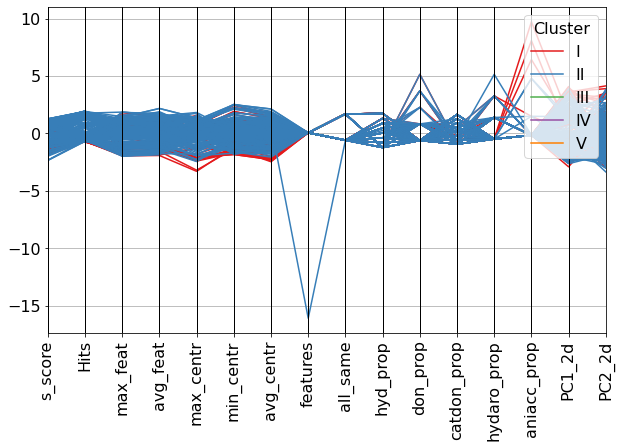

In [31]:
#parallel coordinates plot for test set
plt.figure(figsize=(10,6))
ext_clusters = ext_clusters.sort_values(by = 'clusters')
plot = pd.plotting.parallel_coordinates(ext_clusters, 'clusters', color=['#e41a1c','#377eb8','#4daf4a', '#984ea3', '#ff7f00'])
plot.tick_params(axis='x', rotation=90)
I_line = mlines.Line2D([], [], color='#e41a1c', label='I')
II_line = mlines.Line2D([], [], color='#377eb8', label='II')
III_line = mlines.Line2D([], [], color='#4daf4a', label='III')
IV_line = mlines.Line2D([], [], color='#984ea3', label='IV')
V_line = mlines.Line2D([], [], color='#ff7f00', label='V')
plot.legend(title = "Cluster", handles = [I_line, II_line, III_line, IV_line, V_line], loc = 'upper right')

In [32]:
#PCA biplot w/ loadings for TRAINING SET
X_train_scaled = X_train_scaled.drop('clusters', axis = 1)
X_train_clusterlabels.set_index(X_train_scaled.index, inplace = True)
X_train_scaled['clusters'] = X_train_clusterlabels

plotX = X_train_scaled.copy()

plotX['clusters'] = plotX['clusters'].astype(str)
plotX['clusters'].replace(['4'], '5', inplace = True)
plotX['clusters'].replace(['3'], '4', inplace = True)
plotX['clusters'].replace(['2'], '3', inplace = True)
plotX['clusters'].replace(['1'], '2', inplace = True)
plotX['clusters'].replace(['0'], '1', inplace = True)
plotX.sort_values(by=['clusters'], inplace = True)
#print(plotX)

features = list(plotX.columns[:-3])
print(features)
X = plotX[features]
pca = PCA(n_components=2)
components = pca.fit_transform(X)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter(components, x=0, y=1, color=plotX['clusters'], color_discrete_sequence=['rgba(228,26,28,0.8)', 'rgba(55,126,184, 0.8)', 'rgba(77,175,74, 0.8)', 'rgba(152,78,163, 0.8)', 'rgba(255,127,0, 0.8)'],
                labels={
                    "0": "PC1",
                    "1": "PC2",
                    "color": "Cluster"
                })

for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )
fig.show()

['Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 's_score', 'hyd_prop', 'don_prop', 'catdon_prop']


In [33]:
#PCA biplot w/ loadings for TESTING SET
X_test_scaled = X_test_scaled.drop('clusters', axis = 1)
X_test_clusterlabels.set_index(X_test_scaled.index, inplace = True)
X_test_scaled['clusters'] = X_test_clusterlabels

plotX = X_test_scaled.copy()

plotX['clusters'] = plotX['clusters'].astype(str)
plotX['clusters'].replace(['4'], '5', inplace = True)
plotX['clusters'].replace(['3'], '4', inplace = True)
plotX['clusters'].replace(['2'], '3', inplace = True)
plotX['clusters'].replace(['1'], '2', inplace = True)
plotX['clusters'].replace(['0'], '1', inplace = True)
plotX.sort_values(by=['clusters'], inplace = True)
#print(plotX)

features = list(plotX.columns[:-3])
print(features)
X = plotX[features]
pca = PCA(n_components=2)
components = pca.fit_transform(X)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter(components, x=0, y=1, color=plotX['clusters'], color_discrete_sequence=['rgba(228,26,28,0.8)', 'rgba(55,126,184, 0.8)', 'rgba(77,175,74, 0.8)', 'rgba(152,78,163, 0.8)', 'rgba(255,127,0, 0.8)'],
                labels={
                    "0": "PC1",
                    "1": "PC2",
                    "color": "Cluster"
                })

for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )
fig.show()

['Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 's_score', 'hyd_prop', 'don_prop', 'catdon_prop']


In [34]:
#3D PCA biplot w/ loadings for TRAINING SET
X_train_scaled = X_train_scaled.drop('clusters', axis = 1)
X_train_clusterlabels.set_index(X_train_scaled.index, inplace = True)
X_train_scaled['clusters'] = X_train_clusterlabels

plotX = X_train_scaled.copy()

plotX['clusters'] = plotX['clusters'].astype(str)
plotX['clusters'].replace(['4'], '5', inplace = True)
plotX['clusters'].replace(['3'], '4', inplace = True)
plotX['clusters'].replace(['2'], '3', inplace = True)
plotX['clusters'].replace(['1'], '2', inplace = True)
plotX['clusters'].replace(['0'], '1', inplace = True)
plotX.sort_values(by=['clusters'], inplace = True)
#print(plotX)

features = list(plotX.columns[:-3])
print(features)
X = plotX[features]
pca = PCA(n_components=3)
components = pca.fit_transform(X)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter_3d(components, x=0, y=1, z=2, color=plotX['clusters'], color_discrete_sequence=['rgba(228,26,28,0.8)', 'rgba(55,126,184, 0.8)', 'rgba(77,175,74, 0.8)', 'rgba(152,78,163, 0.8)', 'rgba(255,127,0, 0.8)'],
                labels={
                    "0": "PC1",
                    "1": "PC2",
                    "2": "PC3",
                    "color": "Cluster"
                })

fig.show()

['Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 's_score', 'hyd_prop', 'don_prop', 'catdon_prop']


In [35]:
#3D PCA biplot w/ loadings for testING SET
X_test_scaled = X_test_scaled.drop('clusters', axis = 1)
X_test_clusterlabels.set_index(X_test_scaled.index, inplace = True)
X_test_scaled['clusters'] = X_test_clusterlabels

plotX = X_test_scaled.copy()

plotX['clusters'] = plotX['clusters'].astype(str)
plotX['clusters'].replace(['4'], '5', inplace = True)
plotX['clusters'].replace(['3'], '4', inplace = True)
plotX['clusters'].replace(['2'], '3', inplace = True)
plotX['clusters'].replace(['1'], '2', inplace = True)
plotX['clusters'].replace(['0'], '1', inplace = True)
plotX.sort_values(by=['clusters'], inplace = True)
#print(plotX)

features = list(plotX.columns[:-3])
print(features)
X = plotX[features]
pca = PCA(n_components=3)
components = pca.fit_transform(X)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter_3d(components, x=0, y=1, z=2, color=plotX['clusters'], color_discrete_sequence=['rgba(228,26,28,0.8)', 'rgba(55,126,184, 0.8)', 'rgba(77,175,74, 0.8)', 'rgba(152,78,163, 0.8)', 'rgba(255,127,0, 0.8)'],
                labels={
                    "0": "PC1",
                    "1": "PC2",
                    "2": "PC3",
                    "color": "Cluster"
                })

fig.show()

['Hits', 'max_feat', 'avg_feat', 'max_centr', 'min_centr', 'avg_centr', 'features', 'all_same', 's_score', 'hyd_prop', 'don_prop', 'catdon_prop']


## Dumping Models

In [40]:
# import pickle

# with open('kmeans_5clusters.pkl', 'wb') as f:
#     pickle.dump(clustering,f)
    
# with open('k5_clusterI_regression_model.pkl', 'wb') as f:
#     pickle.dump(sgdc0,f)